In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [63]:
data = pd.read_csv('../data_file/fix_holiday_feature_train.csv')
test_data = pd.read_csv('../data_file/fix_holiday_feature_test.csv')
pred = pd.read_csv('../data_file/8_22.csv')
new_data = pd.read_csv('../data_file/8_22_test.csv')

In [39]:
test_data['power_consumption'] = pred['answer']

In [64]:
data['date_time'] = pd.to_datetime(data['date_time'])
data['date'] = data['date_time'].dt.date


new_data['date_time'] = pd.to_datetime(new_data['date_time'])
new_data['date'] = new_data['date_time'].dt.date

# Group by date and calculate the mean for temperature and power_consumption
# new_daily_means = new_data.groupby('date').agg({
#     'temperature': 'mean',
#     'power_consumption': 'mean'
# }).reset_index()

In [65]:
def plot_temp(i,data, new_data):
    building_numbers = list(range(i*10+1, i*10 + 11))
    
    # Set up the figure for subplots
    fig, axes = plt.subplots(nrows=len(building_numbers), ncols=1, figsize=(14, 4*len(building_numbers)), sharex=True)
    
    for idx, building in enumerate(building_numbers):
        # Filter data for the current building
        building_data = data[data['building_number'] == building]
        building_data = building_data[building_data['holiday'] == 0]
        new_building_data = new_data[new_data['building_number'] == building]
        new_building_data = new_building_data[new_building_data['holiday'] == 0]
        
        # Group by date and calculate mean for temperature and power_consumption for the current building
        building_daily_means = building_data.groupby('date').agg({'temperature': 'mean', 'power_consumption': 'mean'}).reset_index()
        new_daily_means = new_building_data.groupby('date').agg({'temperature': 'mean', 'power_consumption': 'mean'}).reset_index()
        
        
        # Plot temperature for the current building
        color = 'tab:blue'
        ax1 = axes[idx]
        ax1.set_ylabel(f'Building {building}\nMean Temperature (°C)', color=color)
        ax1.plot(building_daily_means['date'], building_daily_means['temperature'], color=color)
        ax1.plot(new_daily_means['date'], new_daily_means['temperature'], color='cyan')
        ax1.tick_params(axis='y', labelcolor=color)
        
        # Create a second y-axis for power consumption for the current building
        ax2 = ax1.twinx()
        color = 'tab:red'
        ax2.set_ylabel('Mean Power Consumption', color=color)
        ax2.plot(building_daily_means['date'], building_daily_means['power_consumption'], color=color)
        ax2.plot(new_daily_means['date'], new_daily_means['power_consumption'], color='magenta')
        ax2.tick_params(axis='y', labelcolor=color)
    
    # Title and show the plot
    plt.suptitle(f'Daily Mean Temperature and Power Consumption for Buildings {building_numbers[0]} to {building_numbers[-1]}', y=1.02, fontsize=16)
    fig.tight_layout()
    plt.show()

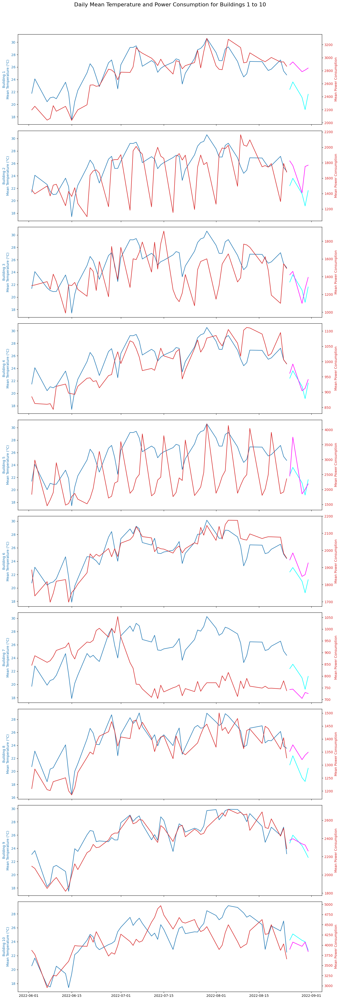

In [66]:
plot_temp(0, data, new_data)

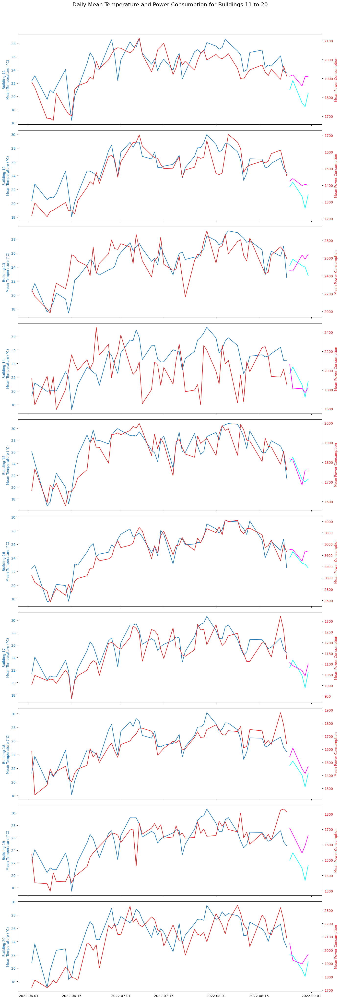

In [67]:
plot_temp(1, data, new_data)

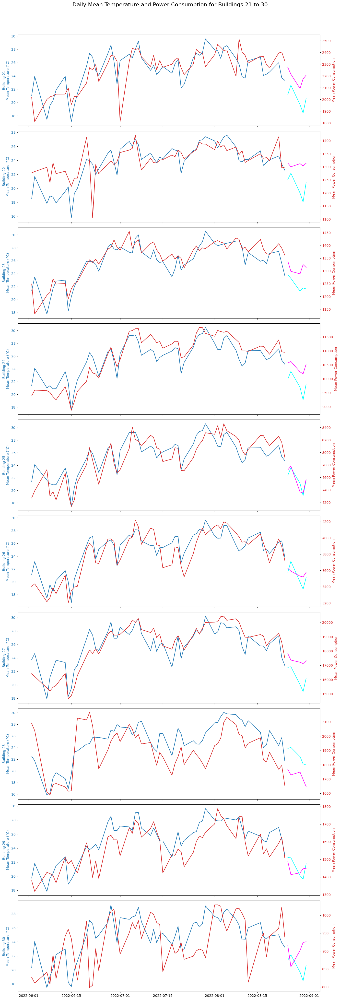

In [68]:
plot_temp(2, data, new_data)

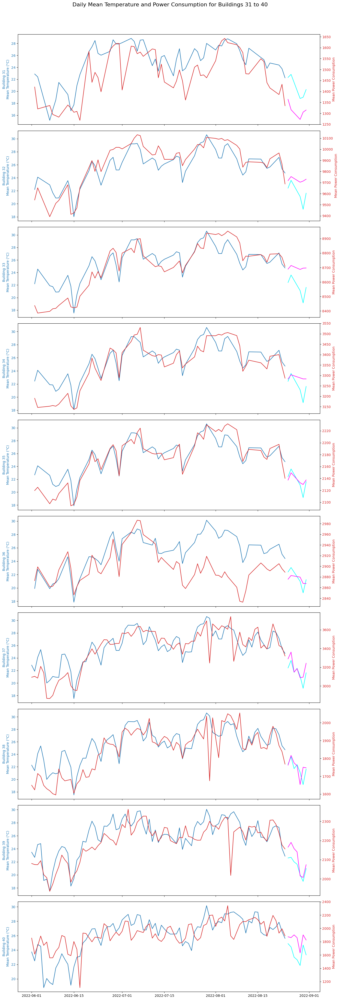

In [69]:
plot_temp(3, data, new_data)

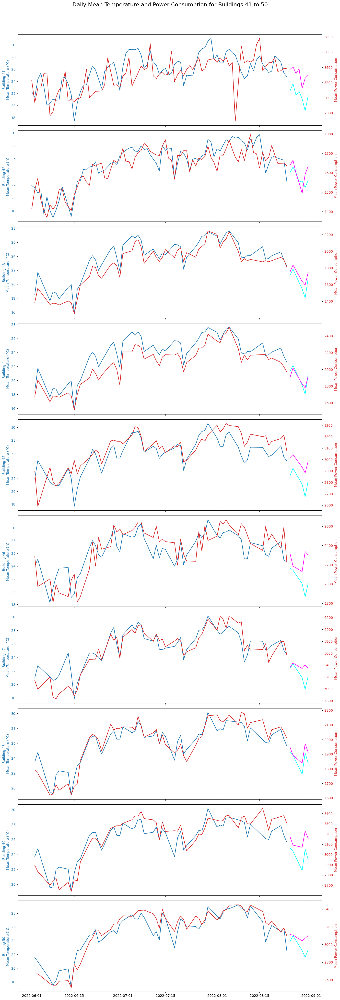

In [70]:
plot_temp(4, data, new_data)

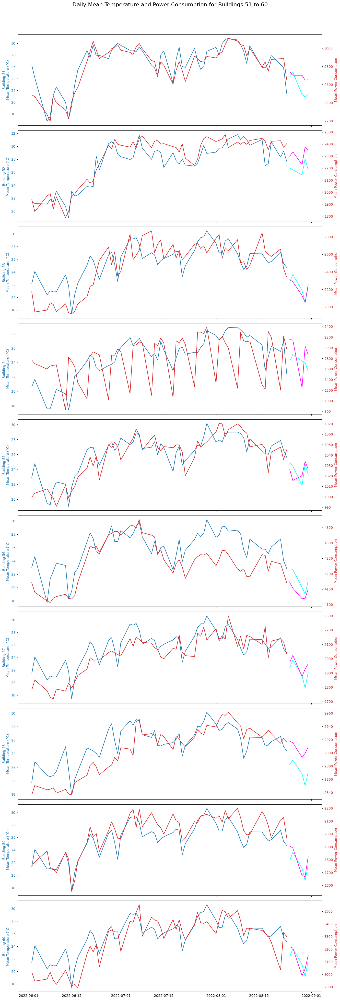

In [71]:
plot_temp(5, data, new_data)

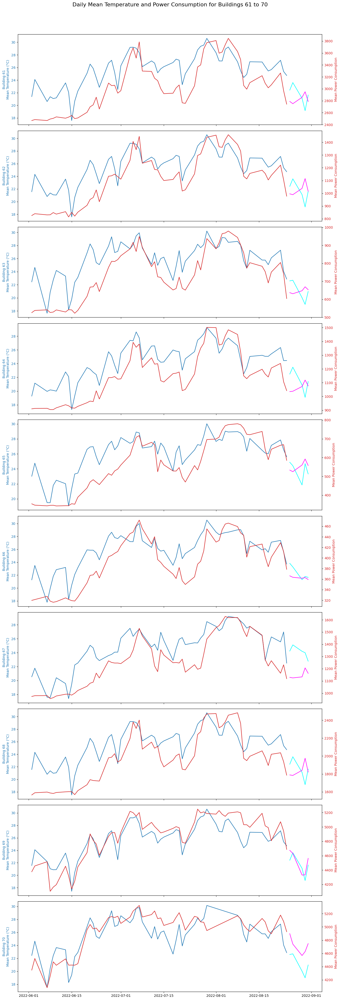

In [72]:
plot_temp(6, data, new_data)

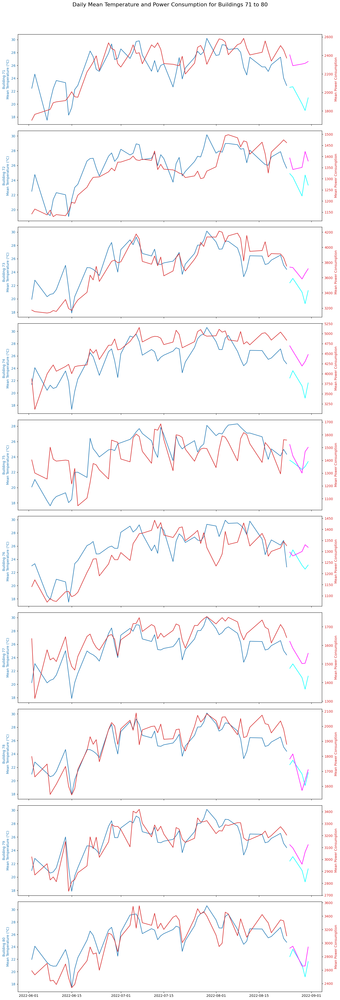

In [73]:
plot_temp(7, data, new_data)

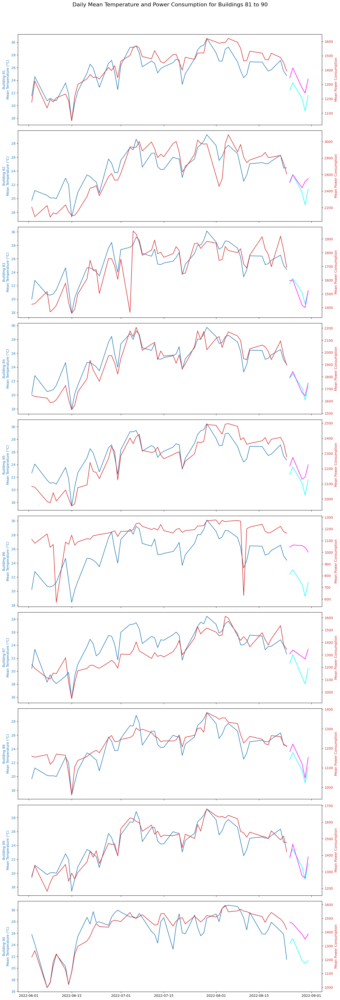

In [74]:
plot_temp(8, data, new_data)

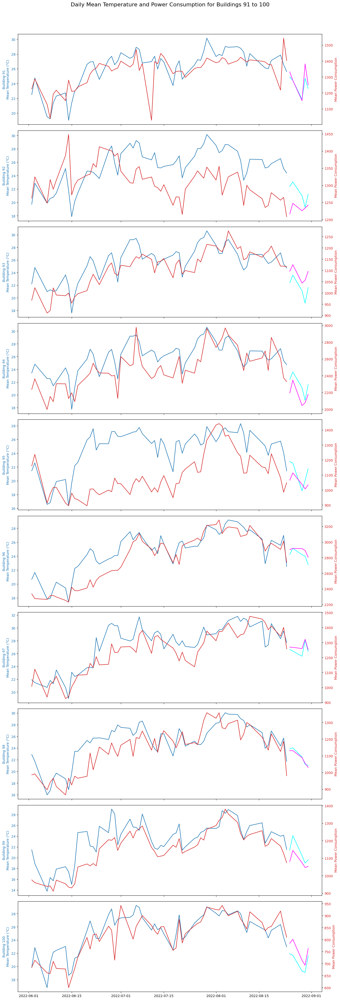

In [75]:
plot_temp(9, data, new_data)

In [54]:
test_data['power_consumption'] = pred['answer']

In [ ]:
test_data.to_csv('8_22_test.csv', index=False)

In [ ]:
test_data

In [ ]:

test_data = pd.read_csv('../data_file/fix_holiday_feature_test.csv')